# In-vivo evidence for increased tau deposition in temporal lobe epilepsy

### Content
1.  *Figure 2:* Network contextualization

# **Figure 2:** Network contextualization

In [1]:
# Libraries
import numpy as np
from brainstat.datasets import fetch_mask, fetch_template_surface

# Load utilities functions from utils.py
from utils import *

### Fetch data

In [2]:
osf_path="/Users/rcruces/Desktop/OSF_data_revision-2025"

# Load the data frame
#osf_df = osf_download("18F-MK6240_in-vivo_database.csv", project_id='ct3gw')
#df = pd.read_csv(osf_df)
df = pd.read_csv(f"{osf_path}/18F-MK6240_in-vivo_database_osf.csv")

# Load processed 18F-MK6240 PET data | matrix:{vertices x subjects}
#osf_pet_raw = osf_download("surf-fsLR-32k_desc-GroupData_smooth-10mm_pvc-probGM_ref-cerebellarGM_trc-18Fmk6240_pet.npy", project_id='ct3gw')
#pet_raw = np.load(osf_pet_raw)
pet_raw = np.load(f"{osf_path}/surf-fsLR-32k_desc-GroupData_smooth-10mm_pvc-probGM_ref-cerebellarGM_trc-18Fmk6240_pet.npy")

# Load fsLR-32 surface
fslr32k_lh = fetch_surface('fsLR-32k.L.surf.gii')
fslr32k_rh = fetch_surface('fsLR-32k.R.surf.gii')
fslr32k = fetch_template_surface("fslr32k", join=True)

# Load fsLR-32k middle wall mask
fslr32k_mask = fetch_mask("fslr32k")

In [3]:
# Load Functional connectome (FC)
#osf_fc = osf_download("surf-fsLR-5k_desc-GroupMean_FC.npy", project_id='ct3gw')
#fc_5k_mean = np.load(osf_fc)
fc_5k_mean = np.load(f"{osf_path}/surf-fsLR-5k_desc-GroupMean_FC.npy")

# Mean columns FC
fc_5k_Colmean = np.mean(fc_5k_mean, axis=0)

# Load weighted Structural connectome (SC)
#osf_sc = osf_download("surf-fsLR-5k_desc-GroupMean_SCw.npy", project_id='ct3gw')
#scw_5k_mean = np.load(osf_sc)
scw_5k_mean = np.load(f"{osf_path}/surf-fsLR-5k_desc-GroupMean_SCw.npy")

# Mean columns SC
scw_5k_Colmean = np.mean(scw_5k_mean, axis=0)

# Load fsLR-5k
fslr5k_lh = fetch_surface('fsLR-5k.L.inflated.surf.gii')
fslr5k_rh = fetch_surface('fsLR-5k.R.inflated.surf.gii')

# Load fsLR-5k mask
fslr5k_mask_lh = fetch_surface('fsLR-5k.L.mask.shape.gii', is_surf=False)
fslr5k_mask_rh =  fetch_surface('fsLR-5k.R.mask.shape.gii', is_surf=False)
fslr5k_mask_bin = np.concatenate((fslr5k_mask_lh, fslr5k_mask_rh), axis=0)

# Labels and boolean mask
fslr5k_mask = fslr5k_mask_bin != 0

# Load the tval map variable (Generated on the Fig.1 ipynb)
#osf_tvals = osf_download("surf-fsLR-32k_desc-tvalues_MixedEffectsModel.npy", project_id='ct3gw')
#mk6240_tval_map = np.load(osf_tvals)
mk6240_tval_map = np.load(f"{osf_path}/surf-fsLR-32k_desc-tvalues_MixedEffectsModel.npy")

# Remove NaN from tmap
mk6240_tval_map[np.isnan(mk6240_tval_map)] = 0

# Resample mk6240 group difference T-val map from fslr32k to fslr5k
mk6240_tval_map_5k = metric_resample(mk6240_tval_map)


### Tau MK6240 Group Differences (tvalues)

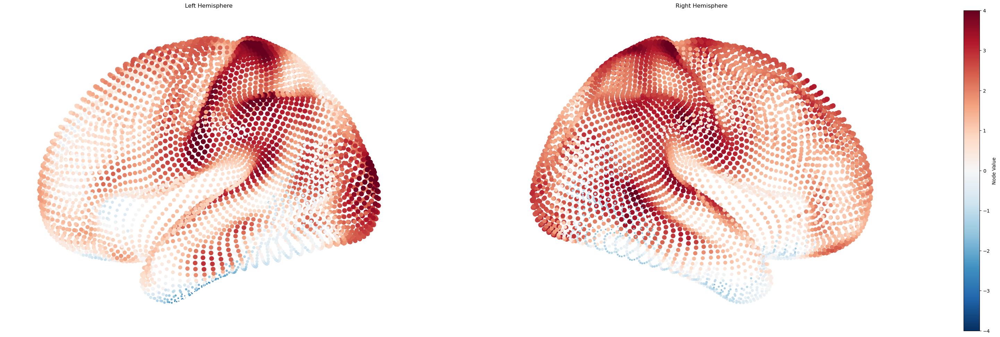

In [4]:
plot_brain_network(fslr5k_lh, fslr5k_rh, fslr5k_mask, fc_5k_mean, node_val=mk6240_tval_map_5k, 
                   node_colmap='RdBu_r', edge_alpha=0, sparcity=0.975, node_colrange=[-4, 4], dpi=100)


### A | Relationship Between Tau MK6240 Group Differences and *Mean Group Connectome*

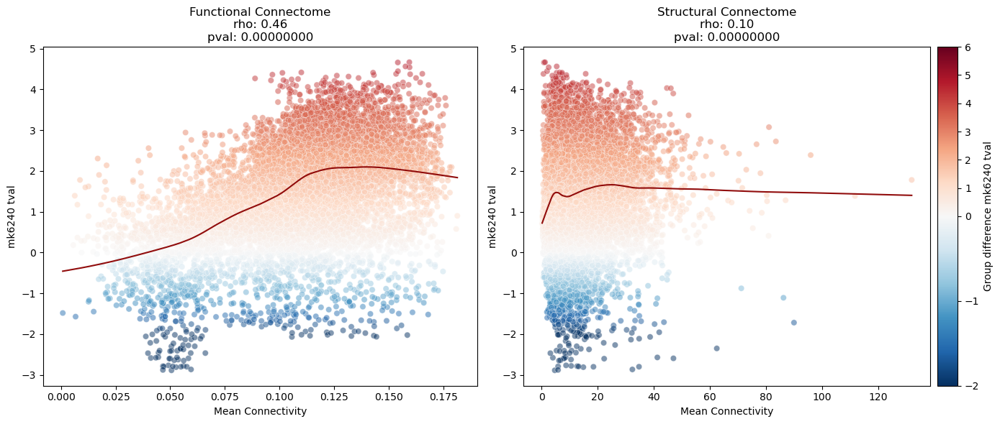

In [5]:
plot_network_correlation(Xval = [fc_5k_Colmean[fslr5k_mask], scw_5k_Colmean[fslr5k_mask]],
    Yval = mk6240_tval_map_5k[fslr5k_mask],
    Xnames = ['Functional Connectome', 'Structural Connectome'])


### Spin permutation to assess significance

> Alexander-Bloch, A. F., Shou, H., Liu, S., Satterthwaite, T. D., Glahn, D. C., Shinohara, R. T., ... & Raznahan, A. (2018). On testing for spatial correspondence between maps of human brain structure and function. Neuroimage, 178, 540-551.

> Vos de Wael, R., Benkarim, O., Paquola, C., Lariviere, S., Royer, J., Tavakol, S., ... & Bernhardt, B. C. (2020). BrainSpace: a toolbox for the analysis of macroscale gradients in neuroimaging and connectomics datasets. Commun Biol 3, 103.

In [6]:
%%time
from brainspace.null_models import SpinPermutations

# Load spheres fsLR5k
sphere_lh = fetch_surface('fsLR-5k.L.sphere.surf.gii')
sphere_rh = fetch_surface('fsLR-5k.R.sphere.surf.gii')

# Set the number of rotations
n_rand = 10000

sp = SpinPermutations(n_rep=n_rand, random_state=0)
sp.fit(sphere_lh, points_rh=sphere_rh)

CPU times: user 35.7 s, sys: 141 ms, total: 35.9 s
Wall time: 36.1 s


,unique,False
,n_rep,10000
,random_state,0
,surface_algorithm,'FreeSurfer'


Mean_sc:
 r: 0.097
 Obs : 3.82237e-20
 Spin: 0.360

Mean_fc:
 r: 0.462
 Obs : 0.00000e+00
 Spin: 0.072



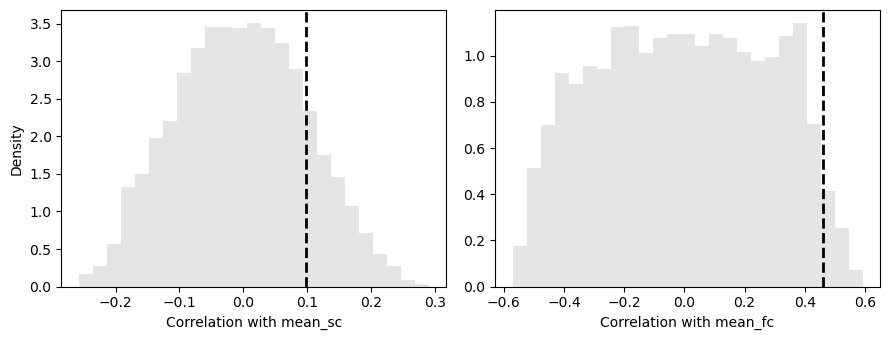

CPU times: user 18.2 s, sys: 951 ms, total: 19.2 s
Wall time: 19.6 s


In [7]:
%%time
plot_network_spintest([fc_5k_Colmean, scw_5k_Colmean], 
                      mk6240_tval_map_5k, sp, fslr5k_mask, Xnames=['mean_fc', 'mean_sc'])

### Mean functional connectome as adjacency matrix

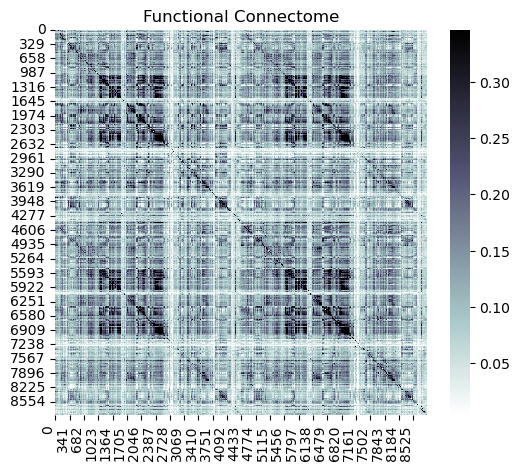

In [8]:
# Slice the FC of the patients to remove the midwall
fc_5k_NO_midwall = fc_5k_mean[fslr5k_mask, :]
fc_5k_NO_midwall = fc_5k_NO_midwall[:, fslr5k_mask]

# Threshold based on the edges
A_edges = fc_5k_NO_midwall[np.tril_indices_from(fc_5k_NO_midwall, k=-1)]
A_qt = np.quantile(A_edges, [0.01, 0.99])

# Plot the group FC mean
plot_connectome(fc_5k_NO_midwall, col='bone_r', xlab='', ylab='', Title='Functional Connectome',
                vmin=A_qt[0], vmax=A_qt[1], figsize=(6,5))


### Mean functional connectome as network

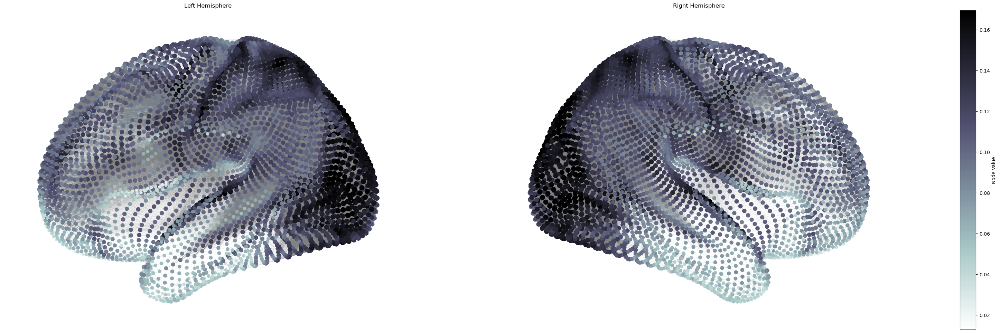

In [9]:
plot_brain_network(fslr5k_lh, fslr5k_rh, fslr5k_mask, fc_5k_mean, node_val=fc_5k_Colmean, 
                   node_colmap='bone_r', edge_alpha=0.4, sparcity=0.975, dpi=100 )


### Mean structural connectome as adjacency matrix

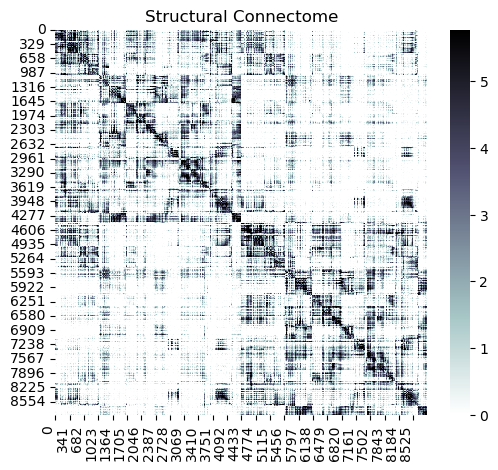

In [10]:
# Slice the SC of the patients to remove the midwall
scw_5k_NO_midwall = scw_5k_mean[fslr5k_mask, :]
scw_5k_NO_midwall = scw_5k_NO_midwall[:, fslr5k_mask]

# log transfor for visualization
scw_5k_NO_midwall_log = np.log(scw_5k_NO_midwall+1)

# Threshold based on the edges
A_edges = scw_5k_NO_midwall_log[np.tril_indices_from(scw_5k_NO_midwall_log, k=-1)]
A_qt = np.quantile(A_edges, [0.01, 0.99])

# Plot the group SCw mean
plot_connectome(scw_5k_NO_midwall_log, col='bone_r', xlab='', ylab='', Title='Structural Connectome',
                vmin=A_qt[0], vmax=A_qt[1], figsize=(6,5))


### Mean structural connectome as network

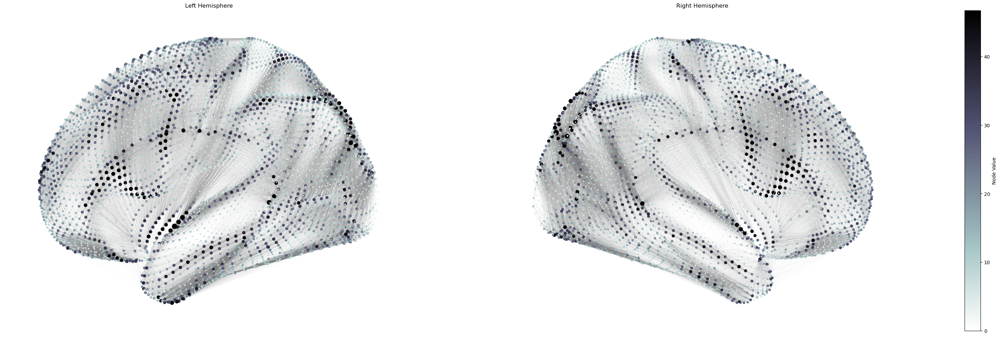

In [11]:
plot_brain_network(fslr5k_lh, fslr5k_rh, fslr5k_mask, scw_5k_mean, node_val=scw_5k_Colmean, 
                   node_colmap='bone_r', edge_alpha=0.3, sparcity=0.995, dpi=100)


### B | Relationship Between Tau MK6240 Group Differences and *Connectome weighted by the neighbours*

Connectome weighted by neighbours:

$$D_i=\frac{1}{N_i} \sum^{N_i}_{j\ne i,j=1} d_j \times FC_{ij}$$

> Shafiei, Golia, et al. "Spatial patterning of tissue volume loss in schizophrenia reflects brain network architecture." Biological psychiatry 87.8 (2020): 727-735.

In [12]:
# Calculate the neighborhood_estimates
_, neig_fc = neighborhood_estimates(mk6240_tval_map_5k[fslr5k_mask], fc_5k_NO_midwall, method='spearman')

_,neig_sc = neighborhood_estimates(mk6240_tval_map_5k[fslr5k_mask], scw_5k_NO_midwall, method='spearman')

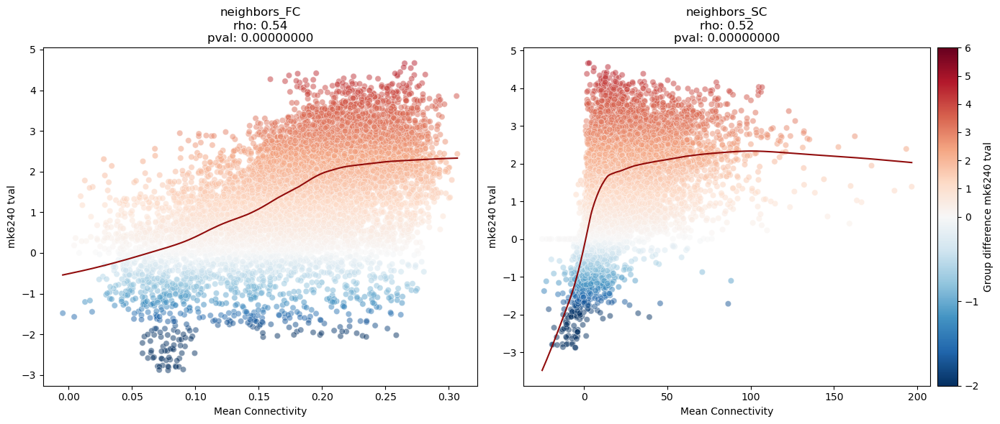

In [13]:
plot_network_correlation(Xval = [neig_fc, neig_sc],
    Yval = mk6240_tval_map_5k[fslr5k_mask],
    Xnames = ['neighbors_FC', 'neighbors_SC'])


### Spin permutation to assess significance

Neighbors_sc:
 r: 0.518
 Obs : 0.00000e+00
 Spin: 0.000

Neighbors_fc:
 r: 0.538
 Obs : 0.00000e+00
 Spin: 0.007



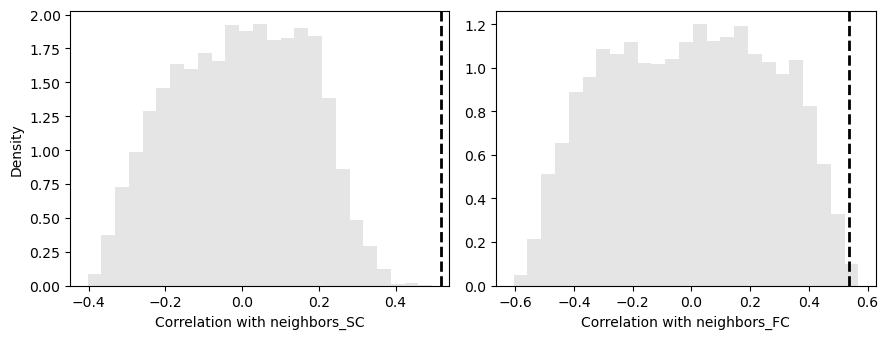

CPU times: user 21.7 s, sys: 4.75 s, total: 26.5 s
Wall time: 36.7 s


In [14]:
%%time
# Map the results to the fsLR-5k surface
fc_neig5k = map_to_labels5k(neig_fc, fslr5k_mask)
sc_neig5k = map_to_labels5k(neig_sc, fslr5k_mask)

plot_network_spintest([fc_neig5k, sc_neig5k], 
                      mk6240_tval_map_5k, sp, fslr5k_mask, Xnames=['neighbors_FC', 'neighbors_SC'])

### Tau MK6240 weighted by the *Functional Connectome* neighbours

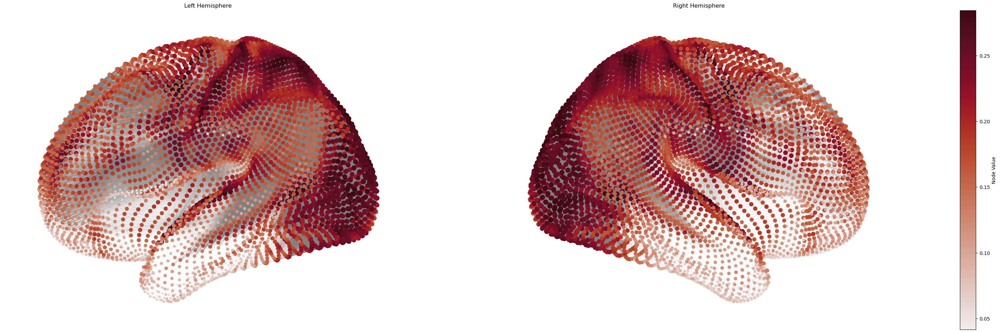

In [15]:
neig_fc_5k = map_to_labels5k(neig_fc, fslr5k_mask)

plot_brain_network(fslr5k_lh, fslr5k_rh, fslr5k_mask, fc_5k_mean, node_val=neig_fc_5k, 
                   node_colmap='cmo.amp', edge_alpha=0.4, sparcity=0.975, dpi=100)

### Tau MK6240 weighted by the *Structural connectome* neighbours

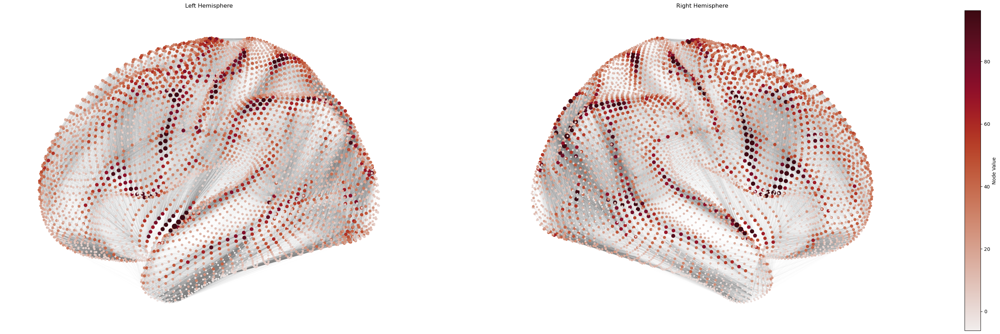

In [16]:
neig_sc_5k = map_to_labels5k(neig_sc, fslr5k_mask)

plot_brain_network(fslr5k_lh, fslr5k_rh, fslr5k_mask, scw_5k_mean, node_val=neig_sc_5k, 
                   node_colmap='cmo.amp', edge_alpha=0.3, sparcity=0.995, dpi=100)